## 0.0 Imports

In [159]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


import numpy   as np
import pandas  as pd
import seaborn as sns

import umap.umap_ as umap

from IPython.display import HTML
from matplotlib import pyplot as plt


from sklearn import cluster       as c
from sklearn import metrics       as m
from sklearn import preprocessing as pp

from plotly import express as px

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer ## pip install yellowbrick




## 0.1. Helper Functions

In [160]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'ggplot')
    plt.rcParams['figure.figsize'] = [24, 9]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    
    sns.set()
    
jupyter_settings()

def Extrair_pais(Regiao):
    
    Registro = Regiao
    
    Registro = Registro.split(',')
    
    fracao = Registro[-1].upper()
    return fracao

Populating the interactive namespace from numpy and matplotlib


## 0.2 Load dataset

In [161]:
df_raw_livros = pd.read_csv('../data/raw/Books.csv', low_memory= False)

In [162]:
df_raw_avaliacao = pd.read_csv('../data/raw/Ratings.csv', encoding='unicode_escape', low_memory= False)

In [163]:
df_raw_usuario = pd.read_csv('../data/raw/Users.csv', encoding='unicode_escape', low_memory= False)

In [164]:
df_raw_livros.shape, df_raw_avaliacao.shape, df_raw_usuario.shape

((271360, 8), (1149780, 3), (278858, 3))

# <font color='red'> 1.0. Descrição dos dados </font>

In [165]:
df1_livros = df_raw_livros.copy()
df1_avaliacao = df_raw_avaliacao.copy()
df1_usuario = df_raw_usuario.copy()

In [166]:
df1_livros.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [167]:
df1_avaliacao.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [168]:
df1_usuario.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


## 1.2 Cruzamento de dados

In [169]:
df1_livros = df_raw_livros.copy()
df1_avaliacao = df_raw_avaliacao.copy()
df1_usuario = df_raw_usuario.copy()

In [170]:
df1 = df1_livros.merge(df1_avaliacao, how='inner', on='ISBN')

df1 = df1_usuario.merge(df1, how='inner', on='User-ID')

In [171]:
df1.shape

(1031136, 12)

## 1.2. Rename columns 

In [172]:
df1.columns

Index(['User-ID', 'Location', 'Age', 'ISBN', 'Book-Title', 'Book-Author',
       'Year-Of-Publication', 'Publisher', 'Image-URL-S', 'Image-URL-M',
       'Image-URL-L', 'Book-Rating'],
      dtype='object')

In [173]:
# Renomar as colunas
df1.rename(
    columns={
        'Book-Title' : 'Titulo',
        'Book-Author' : 'Autor',
        'Year-Of-Publication' : 'Ano_Publicacao',
        'Publisher' : 'Editora',
        'User-ID' :'Id_Cliente',
        'Book-Rating' : 'Avaliacao',
        'Location' : 'Localizacao',
        'Age' : 'Idade'
    }, inplace=True
)

# Verificar
df1.columns

Index(['Id_Cliente', 'Localizacao', 'Idade', 'ISBN', 'Titulo', 'Autor',
       'Ano_Publicacao', 'Editora', 'Image-URL-S', 'Image-URL-M',
       'Image-URL-L', 'Avaliacao'],
      dtype='object')

In [178]:
# problema: Temos Year-Of-Publication com letras e numeros


# identficacao: > coloquei ~ pra pegar apenas numeros 
df1 = df1.loc[~df1['Ano_Publicacao'].apply( lambda x: bool( re.search( '[^0-9]+', x ) ) ), :]
df1.head()

#print( 'Total number of Year-Of-Publication: {}'.format( len( df_letter_invoices ) ) )


,Id_Cliente,Localizacao,Idade,ISBN,Titulo,Autor,Ano_Publicacao,Editora,Image-URL-S,Image-URL-M,Image-URL-L,Avaliacao
0,2,"stockton, california, usa",18.0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,0
1,8,"timmins, ontario, canada",NaN,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,5
2,8,"timmins, ontario, canada",NaN,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,0
3,8,"timmins, ontario, canada",NaN,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,0
4,8,"timmins, ontario, canada",NaN,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,0


In [179]:
df1['Ano_Publicacao']  = pd.to_numeric(df1['Ano_Publicacao'])

C:\Users\Yves Moura\.conda\envs\DataScienceEmProducao\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [180]:
df1.dtypes

Id_Cliente          int64
Localizacao        object
Idade             float64
ISBN               object
Titulo             object
Autor              object
Ano_Publicacao      int64
Editora            object
Image-URL-S        object
Image-URL-M        object
Image-URL-L        object
Avaliacao           int64
dtype: object

In [182]:
df1['pais'] = df1['Localizacao'].apply(Extrair_pais)
df1.head()

C:\Users\Yves Moura\.conda\envs\DataScienceEmProducao\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Id_Cliente,Localizacao,Idade,ISBN,Titulo,Autor,Ano_Publicacao,Editora,Image-URL-S,Image-URL-M,Image-URL-L,Avaliacao,pais
0,2,"stockton, california, usa",18.0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,0,USA
1,8,"timmins, ontario, canada",NaN,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,5,CANADA
2,8,"timmins, ontario, canada",NaN,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,0,CANADA
3,8,"timmins, ontario, canada",NaN,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,0,CANADA
4,8,"timmins, ontario, canada",NaN,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,0,CANADA


In [183]:
df1.nunique()

Id_Cliente         92106
Localizacao        22480
Idade                141
ISBN              270148
Titulo            241068
Autor             101586
Ano_Publicacao       116
Editora            16726
Image-URL-S       269839
Image-URL-M       269839
Image-URL-L       269839
Avaliacao             11
pais                 288
dtype: int64

In [208]:
df1.shape

(1031132, 13)

# <font color='red'> 4.0. EDA </font>

In [184]:
df4 = df1.copy()

In [185]:
df4.describe()

,Id_Cliente,Idade,Ano_Publicacao,Avaliacao
count,1.031132e+06,753299.000000,1.031132e+06,1.031132e+06
mean,1.405944e+05,37.397681,1.968195e+03,2.839056e+00
std,8.052476e+04,14.098255,2.311015e+02,3.854159e+00
min,2.000000e+00,0.000000,0.000000e+00,0.000000e+00
25%,7.041500e+04,28.000000,1.992000e+03,0.000000e+00
50%,1.412100e+05,35.000000,1.997000e+03,0.000000e+00
75%,2.114260e+05,45.000000,2.001000e+03,7.000000e+00
max,2.788540e+05,244.000000,2.050000e+03,1.000000e+01


In [186]:
# Remover as avaliações zeradas
df4 = df4.loc[ df4['Avaliacao'] > 0 ]

# Veriicar
df4.isnull().sum(), df4.shape

(Id_Cliente             0
 Localizacao            0
 Idade             114221
 ISBN                   0
 Titulo                 0
 Autor                  1
 Ano_Publicacao         0
 Editora                2
 Image-URL-S            0
 Image-URL-M            0
 Image-URL-L            0
 Avaliacao              0
 pais                   0
 dtype: int64,
 (383841, 13))

In [187]:
# Verificar
df1['Avaliacao'].describe()

count    1.031132e+06
mean     2.839056e+00
std      3.854159e+00
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      7.000000e+00
max      1.000000e+01
Name: Avaliacao, dtype: float64

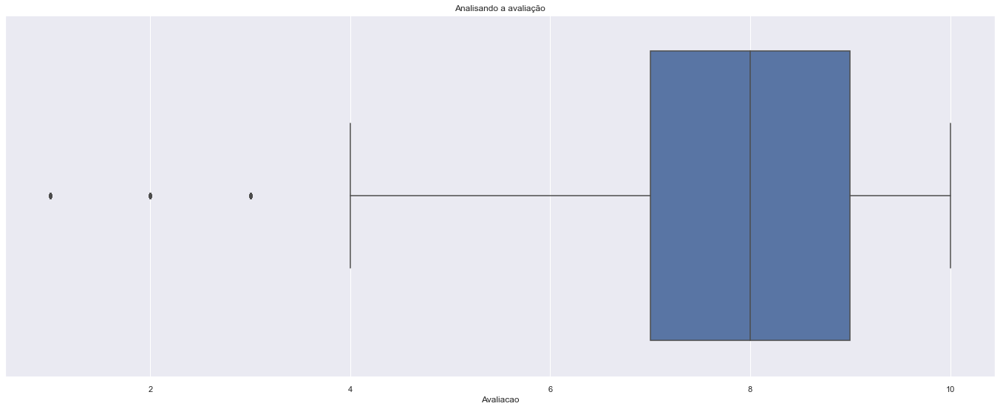

In [188]:
# Analise grafica
plt.title('Analisando a avaliação')
sns.boxplot( data=df4, x='Avaliacao');

In [189]:
# Analise
Analise = df4.groupby( by=['Titulo'] ).agg(
    Quantidade = ('Titulo', 'count'),
    Media = ('Avaliacao', 'mean'),
    Max = ('Avaliacao', 'max'),
    Min = ('Avaliacao', 'min'),
    Mediana = ('Avaliacao', 'median'),
)

# Verificando
Analise.head()

,Quantidade,Media,Max,Min,Mediana
Titulo,,,,,
"A Light in the Storm: The Civil War Diary of Amelia Martin, Fenwick Island, Delaware, 1861 (Dear America)",1,9.000000,9,9,9.0
"Ask Lily (Young Women of Faith: Lily Series, Book 5)",1,8.000000,8,8,8.0
Dark Justice,1,10.000000,10,10,10.0
"Earth Prayers From around the World: 365 Prayers, Poems, and Invocations for Honoring the Earth",7,7.142857,10,1,7.0
Final Fantasy Anthology: Official Strategy Guide (Brady Games),2,10.000000,10,10,10.0


In [190]:
# Verificar
Analise.sort_values('Quantidade', ascending=False ).head()

,Quantidade,Media,Max,Min,Mediana
Titulo,,,,,
The Lovely Bones: A Novel,707,8.185290,10,1,8.0
Wild Animus,581,4.390706,10,1,4.0
The Da Vinci Code,494,8.439271,10,1,9.0
The Secret Life of Bees,406,8.477833,10,2,9.0
The Nanny Diaries: A Novel,393,7.437659,10,1,8.0


In [191]:
# Vericar
Analise.sort_values(['Media', 'Quantidade' ], ascending=False ).head()

,Quantidade,Media,Max,Min,Mediana
Titulo,,,,,
Postmarked Yesteryear: 30 Rare Holiday Postcards,11,10.0,10,10,10.0
The Sneetches and Other Stories,8,10.0,10,10,10.0
Natural California: A Postcard Book,7,10.0,10,10,10.0
Uncle John's Supremely Satisfying Bathroom Reader (Uncle John's Bathroom Reader),7,10.0,10,10,10.0
"Oh, the Thinks You Can Think! (I Can Read It All by Myself Beginner Books)",6,10.0,10,10,10.0


In [192]:
# Analise Qtd x Avaliacao

px.scatter(
    # Dados
    data_frame=Analise,
    # Parametros
    x='Quantidade', y='Media',
    # Titulo
    title='Média x Quantidade - Titulos',
    # Upgrade
    # marginal_y='rug', marginal_x='histogram'
)

In [193]:
# Correlação
Analise.corr()

,Quantidade,Media,Max,Min,Mediana
Quantidade,1.000000,0.018879,0.175572,-0.251497,0.036604
Media,0.018879,1.000000,0.889722,0.842386,0.989839
Max,0.175572,0.889722,1.000000,0.530761,0.887792
Min,-0.251497,0.842386,0.530761,1.000000,0.804023
Mediana,0.036604,0.989839,0.887792,0.804023,1.000000


In [194]:
# Analise
Analise['Quantidade'].describe()

count    135566.000000
mean          2.831396
std           9.135724
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max         707.000000
Name: Quantidade, dtype: float64

In [195]:
# 
def Classificao_Quantidade( Quantidade ):
  '''
    Agrupar a quantidade
  '''

  if int( Quantidade ) <= 5:
    return '1-5 Avaliações'

  elif int( Quantidade) <=10:
    return '6-10 Avaliações'

  elif int(Quantidade) <= 50:
    return '11-50 Avaliações'

  elif int(Quantidade) <= 100:
    return '51-100 Avaliações'

  else:
    return '>101 Avaliações'

# Aplicação
Pizza = Analise['Quantidade'].apply( Classificao_Quantidade ).value_counts( normalize=True )

# Tranformar em um DataFrame
Pizza = pd.DataFrame( Pizza ).reset_index()

# Plot
px.pie( 
    # DAdos
    data_frame=Pizza,
    # Paramewtros
    names='index', values='Quantidade',
    # Titulo
    title='Divisão das Quantidades'
)

In [196]:
# Verificando
Pizza

,index,Quantidade
0,1-5 Avaliações,0.920009
1,6-10 Avaliações,0.042784
2,11-50 Avaliações,0.032589
3,51-100 Avaliações,0.003201
4,>101 Avaliações,0.001416


In [197]:
# Publicação
Anlaise_Ano = df4['Ano_Publicacao'].value_counts().sort_index().reset_index()

# Verificando
Anlaise_Ano.describe()

,index,Ano_Publicacao
count,105.000000,105.000000
mean,1934.028571,3655.628571
std,210.090432,8051.797181
min,0.000000,1.000000
25%,1937.000000,4.000000
50%,1963.000000,63.000000
75%,1989.000000,1652.000000
max,2050.000000,37986.000000


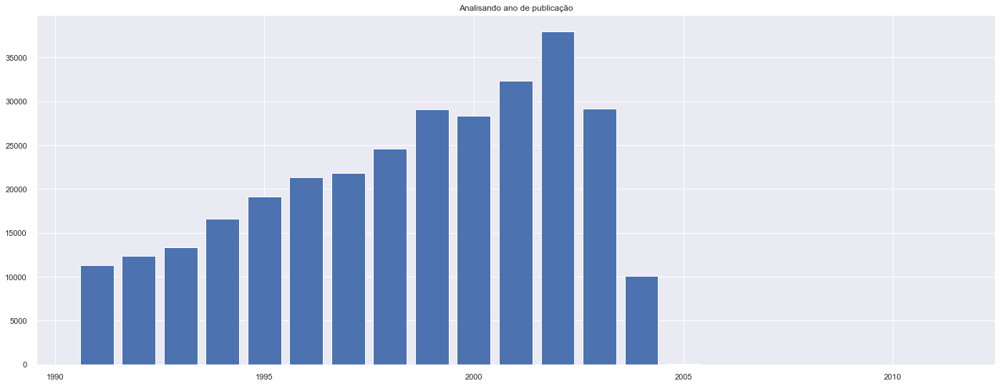

In [198]:
# Plot

# Filtrando o ano
Filtro = Anlaise_Ano.loc[ (Anlaise_Ano['index'] > 1990) & ( Anlaise_Ano['index'] < 2020 ) ]

# Plot
plt.title('Analisando ano de publicação')
plt.bar( Filtro['index'], Filtro['Ano_Publicacao'] );

In [199]:
# Ranikg dos Autores
df4.groupby( by='Autor' ).agg(
    Quantidade = ('Avaliacao', 'count'),
    Media = ('Avaliacao', 'mean'),
).sort_values('Quantidade', ascending=False ).head(10)

,Quantidade,Media
Autor,,
Stephen King,4639,7.815046
Nora Roberts,2938,7.629680
John Grisham,2550,7.523137
James Patterson,2387,7.697947
J. K. Rowling,1746,8.970218
Mary Higgins Clark,1677,7.503280
Janet Evanovich,1490,7.944966
Dean R. Koontz,1475,7.572203
Anne Rice,1245,7.387952


In [200]:
# Concetração das avaliações
df4['pais'].value_counts( normalize=True ).head(10) * 100

 USA               68.378313
 CANADA             9.267900
 UNITED KINGDOM     3.854200
 GERMANY            3.165634
                    2.737852
 SPAIN              1.874995
 AUSTRALIA          1.821327
 N/A                1.811948
 FRANCE             1.207792
 PORTUGAL           0.897507
Name: pais, dtype: float64

In [203]:
# Concetração das avaliações
df4['pais'].value_counts( normalize=True ).cumsum().head(10) * 100

 USA               68.378313
 CANADA            77.646213
 UNITED KINGDOM    81.500413
 GERMANY           84.666047
                   87.403899
 SPAIN             89.278894
 AUSTRALIA         91.100221
 N/A               92.912169
 FRANCE            94.119961
 PORTUGAL          95.017468
Name: pais, dtype: float64

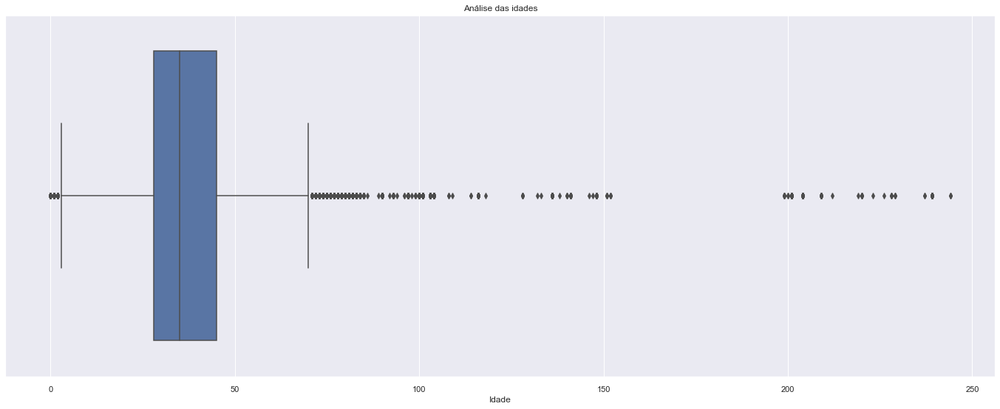

In [205]:
# Idade
plt.title('Análise das idades')
sns.boxplot( data=df4, x='Idade' );

# Construção do Modelo

In [206]:
# Ajustar ( Avaliação dos Livros --> Tab_Cruzada )

# Ajustando a Tabela de Avaliacoes
Avaliacoes = Analise.reset_index().iloc[:, 0:2]

# Cruzando os dados
Tab_Final = df4.merge( Avaliacoes, how='inner', on='Titulo' )

# VErificando
Tab_Final.head()

,Id_Cliente,Localizacao,Idade,ISBN,Titulo,Autor,Ano_Publicacao,Editora,Image-URL-S,Image-URL-M,Image-URL-L,Avaliacao,pais,Quantidade
0,8,"timmins, ontario, canada",NaN,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,5,CANADA,9
1,11676,"n/a, n/a, n/a",NaN,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,N/A,9
2,67544,"toronto, ontario, canada",30.0,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,CANADA,9
3,116866,"ottawa, ,",NaN,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,9,,9
4,123629,"kingston, ontario, canada",NaN,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,9,CANADA,9


In [207]:
Tab_Final.shape

(383841, 14)

In [209]:
# Filtrar
Livros_Avaliados = Tab_Final.loc[ Tab_Final['Quantidade'] >= 50 ]

# Dimensao
Livros_Avaliados.shape

(65477, 14)

In [210]:
# Duplicados
Livros_Avaliados.duplicated().sum()

0

In [211]:
# Gerar a Metriz 
Matriz = Livros_Avaliados.pivot_table( values='Avaliacao', index='Titulo', columns='Id_Cliente' )

# Retirar os NAN
Matriz.fillna( 0, inplace=True)

# VErificar
Matriz.head()

Id_Cliente,9,16,26,32,42,51,91,97,99,114,125,165,169,183,185,224,226,242,243,244,254,256,272,280,332,367,383,388,424,433,440,446,453,486,487,493,496,503,505,507,558,566,595,638,641,643,657,660,685,695,709,714,735,746,763,774,778,785,805,819,824,834,882,885,899,900,901,915,929,938,941,965,999,1008,1009,1016,1021,1022,1024,1025,1031,1032,1040,1054,1060,1075,1083,1108,1111,1113,1118,1129,1131,1155,1161,1167,1210,1211,1223,1235,1248,1249,1252,1254,1259,1261,1264,1266,1281,1293,1294,1297,1309,1359,1376,1377,1389,1396,1412,1424,1427,1433,1434,1435,1436,1448,1486,1489,1500,1504,1511,1513,1515,1519,1530,1535,1548,1558,1559,1585,1596,1597,1608,1619,1641,1650,1652,1660,1674,1706,1718,1730,1733,1768,1773,1790,1792,1803,1805,1812,1830,1848,1892,1898,1903,1928,1933,1949,2010,2012,2018,2019,2030,2033,2036,2041,2089,2099,2103,2108,2110,2116,2127,2139,2148,2152,2169,2178,2179,2183,2197,2198,2199,2204,2218,2238,2250,2253,2255,2271,2276,2281,2287,2288,2295,2296,2313,2333,2337,2345,2357,2358,2375,2376,2379,2385,2388,2399,2411,2414,2439,2466,2481,2484,2499,2503,2528,2550,2559,2562,2565,2569,2591,2611,2632,2638,2640,2670,2700,2749,2766,2770,2776,2789,2790,2793,2799,2854,2855,2891,2907,2966,2977,2982,2992,2995,2996,3005,3009,3026,3032,3052,3054,3079,3099,3100,3104,3113,3133,3145,3154,3166,3167,3168,3191,3192,3206,3261,3282,3296,3300,3305,3310,3329,3331,3344,3346,3350,3362,3363,3371,3373,3374,3393,3416,3418,3427,3460,3467,3481,3507,3509,3512,3514,3538,3541,3542,3543,3556,3569,3578,3580,3588,3593,3596,3601,3628,3640,3669,3675,3693,3694,3709,3719,3739,3756,3757,3780,3799,3814,3817,3821,3827,3839,3840,3865,3869,3894,3917,3923,3939,3948,3954,3965,3975,3977,3999,4017,4035,4053,4059,4066,4077,4085,4090,4091,4092,4098,4107,4114,4131,4138,4143,4144,4149,4157,4164,4169,4179,4183,4187,4188,4193,4196,4197,4221,4223,4225,4228,4303,4334,4365,4385,4386,4426,4438,4475,4483,4516,4551,4570,4571,4574,4579,4600,4622,4669,4732,4784,4785,4795,4802,4809,4821,4864,4878,4896,4900,4938,4973,4999,5003,5034,5037,5040,5048,5049,5055,5091,5101,5126,5151,5163,5183,5207,5268,5286,5289,5294,5296,5297,5333,5337,5358,5359,5361,5371,5375,5385,5416,5439,5448,5451,5476,5483,5490,5499,5501,5539,5555,5559,5582,5585,5599,5600,5604,5609,5636,5638,5665,5669,5674,5709,5722,5728,5737,5746,5768,5782,5783,5784,5791,5792,5815,5850,5866,5899,5903,5912,5922,5932,5942,5948,5956,5963,5968,5981,5998,6015,6017,6018,6022,6073,6074,6092,6102,6112,6115,6125,6135,6142,6153,6169,6178,6184,6217,6226,6238,6239,6242,6243,6247,6251,6253,6280,6308,6318,6323,6333,6336,6345,6347,6348,6349,6368,6392,6398,6401,6415,6431,6452,6492,6501,6532,6535,6537,6543,6563,6566,6568,6575,6577,6582,6592,6611,6637,6652,6670,6679,6680,6689,6700,6704,6763,6764,6768,6772,6778,6781,6787,6789,6795,6798,6803,6815,6824,6840,6866,6871,6872,6884,6893,6894,6900,6906,6912,6924,6944,6958,6975,6991,7033,7037,7053,7056,7071,7072,7078,7079,7082,7084,7088,7105,7107,7119,7125,7134,7155,7158,7160,7194,7210,7218,7226,7228,7248,7283,7286,7301,7306,7312,7316,7318,7319,7338,7341,7346,7352,7371,7384,7398,7404,7409,7412,7424,7426,7431,7467,7474,7482,7500,7507,7509,7524,7528,7538,7551,7557,7569,7576,7610,7614,7620,7621,7629,7634,7651,7784,7809,7819,7820,7841,7856,7860,7864,7874,7875,7881,7887,7890,7893,7909,7913,7915,7930,7941,7954,7958,7980,7982,7983,7994,8006,8016,8018,8019,8027,8040,8047,8054,8059,8066,8067,8073,8081,8086,8089,8095,8099,8109,8115,8141,8154,8167,8168,8186,8187,8188,8189,8219,8220,8234,8238,8240,8245,8250,8253,8255,8263,8265,8268,8278,8282,8284,8290,8296,8308,8309,8314,8317,8323,8346,8361,8362,8370,8453,8454,8487,8529,8541,8570,8580,8599,8613,8630,8633,8652,8660,8674,8680,8681,8682,8687,8712,8734,8737,8762,8772,8780,8782,8801,8839,8840,8843,8853,8856,8864,8870,8872,8874,8930,8933,8935,8936,8937,8952,8955,8961,8988,9016,9034,9083,9105,9138,9139,9141,9154,9172,9174,9177,9178,9203,9219,9226,9227,9275,9279,9296,9302,9314,9340,9343,9354,9381,9389,9394,9414,9417,9419,9454,9484,9486,9490,9492,9502,9504,9555,9568,9574,9579,9605,9613,9626,9637,96

In [ ]:
Tab_Cruzada.loc[ Tab_Cruzada['Titulo'] == '1984' ].head()

In [212]:
# Trnasformação para vetores
from scipy.sparse import csc_matrix
Matriz_Sparse = csc_matrix( Matriz )

Matriz_Sparse

<651x24863 sparse matrix of type '<class 'numpy.float64'>'
	with 65081 stored elements in Compressed Sparse Column format>

In [213]:
# Exemplo da função
csc_matrix(  (4, 4), dtype=np.int8 ).toarray()

array([[0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0]], dtype=int8)

In [214]:
# Criar o Modelo
from sklearn.neighbors import NearestNeighbors

# Parametros
Modelo = NearestNeighbors(
    # Quantidade de recomendações
    n_neighbors=5,
    # Algoritmo
    algorithm='brute',
    # metrica de distancia
    metric='minkowski'
)

# Fitar o modelo
Modelo.fit( Matriz_Sparse )

NearestNeighbors(algorithm='brute')

In [215]:
# Recomendações
# Escolher_Livro

# Descobrir Libros Harry
for Posicao, Titulo in enumerate(Matriz.index):

  # Harry
  if 'Harry' in Titulo:
    print( Posicao, Titulo )

213 Harry Potter and the Chamber of Secrets (Book 2)
214 Harry Potter and the Goblet of Fire (Book 4)
215 Harry Potter and the Order of the Phoenix (Book 5)
216 Harry Potter and the Prisoner of Azkaban (Book 3)
217 Harry Potter and the Sorcerer's Stone (Book 1)
218 Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))


In [216]:
# Seleionando o Livro ##### CLIENTE COMPROU !!!!!! ######
Selecionar_Livro = Matriz.iloc[ 213, :].values.reshape( 1, -1 )

# Previsão do Modelo
Distancia, Recomendacao = Modelo.kneighbors( Selecionar_Livro )

## AVALIAÇAO / RENTABILIDADE /  SERIES / NOTICIAS

#### RECOMENDAÇÔES ######
# Ver as sugestões
for Loop in range( len(Recomendacao) ):

  print( Matriz.index[ Recomendacao[Loop] ] )

Index(['Harry Potter and the Chamber of Secrets (Book 2)',
       'Harry Potter and the Prisoner of Azkaban (Book 3)',
       'Harry Potter and the Goblet of Fire (Book 4)',
       'Harry Potter and the Sorcerer's Stone (Book 1)',
       'Don't Stand Too Close to a Naked Man'],
      dtype='object', name='Titulo')


In [217]:
Distancia

array([[  0.        , 150.46714296, 150.8951991 , 158.7714115 ,
        165.39481384]])